# Projeto de Regressão Logística - Publicidade

Este projeto tem como objetivo criar um modelo que preveja se um usuário clicará ou não em um anúncio baseado em um conjunto de dados de publicidade falso, utilizando o método da regressão logística.

Este conjunto de dados contém os seguintes recursos:

* **tempo_diario_site**: Tempo diário que o usuário permanece no site em minutos.
* **idade**: Idade do usuário.
* **renda_media_regiao**: Renda média da região onde o usuário reside.
* **tempo_medio_internet**: Média em minutos por dia que o usuário está na internet.
* **titulo**: Título do anúncio.
* **cidade**: Cidade do usuário.
* **sexo**: Sexo do usuário: 0 para masculino e 1 para feminino. 
* **pais**: País do usuário.
* **timestamp_clique'**: Hora em que o usuário clicou no anúncio ou janela fechada.
* **clique**: Indica se o usuário clicou (0) ou não (1) no anúncio.

## Etapas do projeto
1. Coleta de dados
2. Análise exploratória dos dados
3. Criação de modelos
4. Validação de modelos
5. Apresentação dos resultados

In [1]:
## Importar bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## 1. Coleta de dados

**Leitura dos dados.**

In [2]:
dados = pd.read_csv('advertising.csv')

**Conferindo as 10 primeiras linhas**

In [3]:
dados.head(10)

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0
5,59.99,23,59761.56,226.74,Sharable client-driven software,Jamieberg,1,Norway,2016-05-19 14:30:17,0
6,88.91,33,53852.85,208.36,Enhanced dedicated support,Brandonstad,0,Myanmar,2016-01-28 20:59:32,0
7,66.00,48,24593.33,131.76,Reactive local challenge,Port Jefferybury,1,Australia,2016-03-07 01:40:15,1
8,74.53,30,68862.00,221.51,Configurable coherent function,West Colin,1,Grenada,2016-04-18 09:33:42,0
9,69.88,20,55642.32,183.82,Mandatory homogeneous architecture,Ramirezton,1,Ghana,2016-07-11 01:42:51,0


## 2. Análise de dados exploratória

**Análise descritiva preliminar do dataframe.**

In [4]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tempo_diario_site     1000 non-null   float64
 1   idade                 1000 non-null   int64  
 2   renda_media_regiao    1000 non-null   float64
 3   tempo_medio_internet  1000 non-null   float64
 4   titulo                1000 non-null   object 
 5   cidade                1000 non-null   object 
 6   sexo                  1000 non-null   int64  
 7   pais                  1000 non-null   object 
 8   timestamp_clique      1000 non-null   object 
 9   clique                1000 non-null   int64  
dtypes: float64(3), int64(3), object(4)
memory usage: 78.2+ KB


In [5]:
dados.describe()

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,sexo,clique
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,65.000200,36.009000,55000.000080,180.000100,0.481000,0.50000
std,15.853615,8.785562,13414.634022,43.902339,0.499889,0.50025
min,32.600000,19.000000,13996.500000,104.780000,0.000000,0.00000
25%,51.360000,29.000000,47031.802500,138.830000,0.000000,0.00000
50%,68.215000,35.000000,57012.300000,183.130000,0.000000,0.50000
75%,78.547500,42.000000,65470.635000,218.792500,1.000000,1.00000
max,91.430000,61.000000,79484.800000,269.960000,1.000000,1.00000


**Uma análise descritiva mais profunda será feita utilizando a biblioteca Pandas profiling, que gerará um relatório dos dados contendo informações detalhadas.**

In [6]:
from pandas_profiling import ProfileReport

relatorio = ProfileReport(dados, title='Relatório dos Anúncios')
relatorio.to_file('relatorio_dos_anuncios.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Questionamentos 

- Quantas observações (linhas) e quantas *features* (colunas) compõem o conjunto de dados?
    - Há 1000 observações e 10 *features*, sendo 4 numéricas e 6 categóricas: 3 float64, 3 int64 e 4 object.
- Há *missing values* (valores faltantes)?
    - Não.
- Há dados duplicados?
    - Não.
- As features alvos estão desbalanceadas?
    - A feature alvo é a variável 'clique', que **não** está desbalanceada: há exatamente a mesma quantidade de registros para ambos os valores que a variável pode assumir.
- Existem features compostas?
    - Sim, a variável 'timestamp' é composta por ano, mês, dia, hora, minuto e segundo, da qual é possível extrair variáveis individuais.

**Conversão do tipo da feature 'timestamp_clique' de *object* para *datetime*, para posterior extração das variáveis individuais.**

In [7]:
dados['timestamp_clique'] =  pd.to_datetime(dados['timestamp_clique'])
dados['timestamp_clique']

0     2016-03-27 00:53:11
1     2016-04-04 01:39:02
2     2016-03-13 20:35:42
3     2016-01-10 02:31:19
4     2016-06-03 03:36:18
              ...        
995   2016-02-11 21:49:00
996   2016-04-22 02:07:01
997   2016-02-01 17:24:57
998   2016-03-24 02:35:54
999   2016-06-03 21:43:21
Name: timestamp_clique, Length: 1000, dtype: datetime64[ns]

**Criação das colunas 'ano', 'mês' e 'dia'.**

In [8]:
dados['ano'] = dados['timestamp_clique'].dt.year
dados['mes'] = dados['timestamp_clique'].dt.month
dados['dia'] = dados['timestamp_clique'].dt.day

dados.head()

,tempo_diario_site,idade,renda_media_regiao,tempo_medio_internet,titulo,cidade,sexo,pais,timestamp_clique,clique,ano,mes,dia
0,68.95,35,61833.90,256.09,Cloned 5thgeneration orchestration,Wrightburgh,0,Tunisia,2016-03-27 00:53:11,0,2016,3,27
1,80.23,31,68441.85,193.77,Monitored national standardization,West Jodi,1,Nauru,2016-04-04 01:39:02,0,2016,4,4
2,69.47,26,59785.94,236.50,Organic bottom-line service-desk,Davidton,0,San Marino,2016-03-13 20:35:42,0,2016,3,13
3,74.15,29,54806.18,245.89,Triple-buffered reciprocal time-frame,West Terrifurt,1,Italy,2016-01-10 02:31:19,0,2016,1,10
4,68.37,35,73889.99,225.58,Robust logistical utilization,South Manuel,0,Iceland,2016-06-03 03:36:18,0,2016,6,3


### Visualização dos dados

- **Qual é a distribuição da idade dos usuários?**
    - A maior parte dos usuários apresentam idade entre 25 e 45 anos.

Text(0, 0.5, 'Quantidade de usuários')

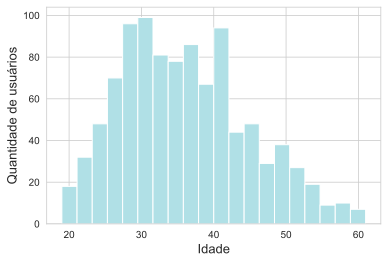

In [10]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

sns.set_style('whitegrid')
dados['idade'].hist(bins=20, color='powderblue')
plt.xlabel('Idade', fontsize=13)
plt.ylabel('Quantidade de usuários', fontsize=13)

- **Usuários mais velhos residem em regiões de renda média maior que usuários mais novos?**
    - A renda média da região não apresenta correlação com a idade do usuário.

Text(29.0, 0.5, 'Renda média da região')

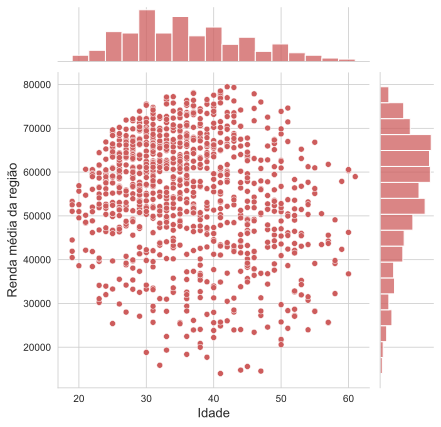

In [11]:
h=sns.jointplot(x='idade', y='renda_media_regiao', data=dados, color='indianred')
h.ax_joint.set_xlabel('Idade', fontsize=13)
h.ax_joint.set_ylabel('Renda média da região', fontsize=13)

- **Usuários mais jovens passam mais tempo no site?**
    - Observa-se uma maior concentração na parte superior a esquerda do gráfico, bem como um pico deslocado à esquerda na curva de distribuição de tempo por idade, indicando portanto que usuários entre aproximadamente 25 e 40 anos passam mais tempo no site, entre 65 e 80 minutos.

Text(29.0, 0.5, 'Tempo diário ativo no site (min)')

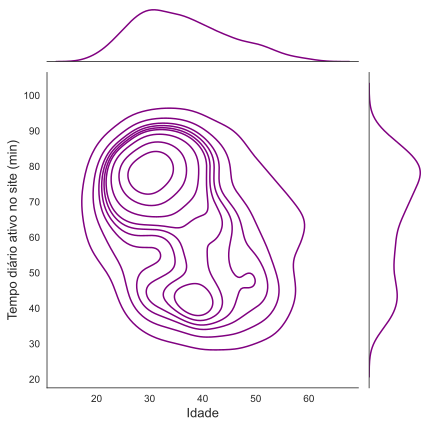

In [12]:
sns.set_style('white')
h=sns.jointplot(x='idade', y='tempo_diario_site', data=dados, kind='kde',color='purple')
h.ax_joint.set_xlabel('Idade', fontsize=13)
h.ax_joint.set_ylabel('Tempo diário ativo no site (min)', fontsize=13)

- **Quem passa mais tempo na internet, passa mais tempo no site?**
    - Observam-se duas regiões de concentração no gráfico, indicando que usuários que passam mais tempo no internet tendem a passar mais tempo no site. Da mesma forma, usuários que passam menos tempo na internet costumam passar menos tempo no site

Text(29.0, 0.5, 'Tempo diário ativo no site (min)')

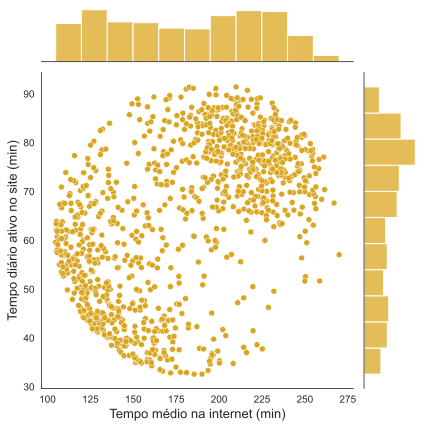

In [13]:
sns.set_style('white')
h=sns.jointplot(x='tempo_medio_internet', y='tempo_diario_site', data=dados,color='goldenrod')
h.ax_joint.set_xlabel('Tempo médio na internet (min)', fontsize=13)
h.ax_joint.set_ylabel('Tempo diário ativo no site (min)', fontsize=13)

- **Quais usuários clicaram mais no site?**
    - É possível observar que muitas features apresentam separações claras entre os cliques. Esse comportamente permite que seja possível prever se um usuário irar clicar ou não de acordo com as informações que se tem sobre ele utilizando o método da **regressão logística**. 

In [14]:
# O pairplot plota a relação entre todos os pares de variáveis do conjunto de dados agrupados pela feature clique.
sns.pairplot(dados, hue='clique', palette = 'husl')

C:\Users\mafpp\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


### Insights gerais

- A maior parte dos usuários apresentam idade entre 25 e 45 anos.
- Não foi observada uma dependência entre a renda média da região e a idade do usuário.
- Usuários entre aproximadamente 25 e 40 anos passam mais tempo no site, entre 65 e 80 minutos.
- Observou-se uma correlação positiva entre o tempo médio na internet e o tempo diário no site.
- Há clara separação de cliques para algumas features, sendo conveniente usar o modelo de regressão logística pra predizer o comprotamento de futuros usuários.

# 3. Criação de modelos

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

def modelo(X, Y):
    
    #Quebra do conjunto de dados em um grupo de treino e outro de teste
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
    
    #Instanciando o método da regressão linear
    logmodel = LogisticRegression()

    #Ajuste do modelo com o conjunto de treino
    logmodel.fit(X_train, Y_train)
    
    #Previsão do modelo usando os dados de teste
    Y_model = logmodel.predict(X_test)
    
    # Medidas para avaliação da qualidade do modelo 
    avaliacao = classification_report(Y_test, Y_model, output_dict=True)
    
    acuracia  = avaliacao['accuracy']
    precisao  = avaliacao['macro avg']['precision'] 
    recall    = avaliacao['macro avg']['recall']    
    f1        = avaliacao['macro avg']['f1-score']
    
    return acuracia, precisao, recall, f1

#variáveis independentes, ou seja, as informações necessárias para se fazer a previsão, para cada modelo
X = [
     dados[['tempo_diario_site','idade','renda_media_regiao']], #Modelo 1
     dados[['tempo_diario_site','idade','tempo_medio_internet']], #Modelo 2
     dados[['renda_media_regiao','idade','tempo_medio_internet']], #Modelo 3
     dados[['renda_media_regiao','tempo_diario_site','tempo_medio_internet']], #Modelo 4
     dados[['renda_media_regiao','tempo_diario_site','tempo_medio_internet','dia']], #Modelo 5
     dados[['tempo_medio_internet','idade','renda_media_regiao','sexo']], #Modelo 6
     dados[['idade','renda_media_regiao','tempo_medio_internet','sexo']], #Modelo 7
     dados[['tempo_diario_site', 'renda_media_regiao', 'tempo_medio_internet', 'sexo']], #Modelo 18
    ]

#variável dependente, a qual se quer prever
Y = dados['clique'] 

## 4. Validação de modelos

In [16]:
df_resultado = pd.DataFrame(columns=['Acurácia', 'Precisão', 'Recall', 'F1-Score'])

j=0
for i in X:
    resultado = modelo(i,Y)
    df_resultado.loc[j] = resultado
    j+=1
    
df_resultado.index = df_resultado.reset_index().index+1
df_resultado = df_resultado.T.add_prefix('Modelo ').T
df_resultado

,Acurácia,Precisão,Recall,F1-Score
Modelo 1,0.886667,0.893939,0.888543,0.886419
Modelo 2,0.940000,0.940000,0.940313,0.939989
Modelo 3,0.860000,0.864419,0.861502,0.859844
Modelo 4,0.946667,0.946667,0.946985,0.946657
Modelo 5,0.666667,0.670725,0.668386,0.665939
Modelo 6,0.860000,0.864419,0.861502,0.859844
Modelo 7,0.860000,0.864419,0.861502,0.859844
Modelo 8,0.943333,0.943778,0.943916,0.943333


## 5. Apresentação dos resultados
- De modo geral, os modelos de regressão logística apresentaram boa performance na predição dos cliques.
- O modelo 4 apresentou valores mais altos para as medidas de qualidade de ajuste (0.95), sendo, portanto, o modelo mais adequado.
- O tempo diário no site, a renda média da região e o tempo médio de internet são os atributos mais importantes para a previsão do clique.
- As feautres de mês e dia prejudicaram desempenho dos modelos, enquanto a feature de ano não provocou nenhuma alteração. Talvez a quantidade de dados seja insuficiente para considerar o tempo.
- A feature de sexo também não não apresentou nenhuma mudança na performance dos modelos.